### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku (`cv2.threshold` odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [1]:
import cv2
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from utils import *

In [2]:
# tło 0 obiekty 1

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania. W jaki sposób ustalisz wartość progu? Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

# Rozwiązanie części 1A:

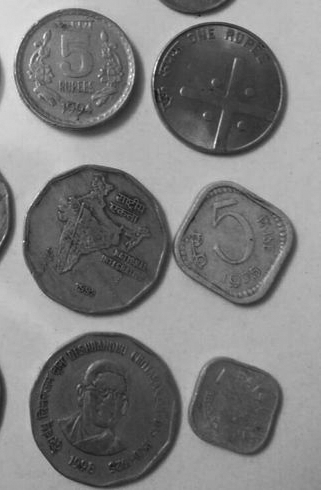

In [3]:
# 1A
monety_szare = cv2.imread('dane/Monety_szare.bmp')
monety_hsv = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2HSV) # HSV - Hue, Saturation, Value
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

## BGR

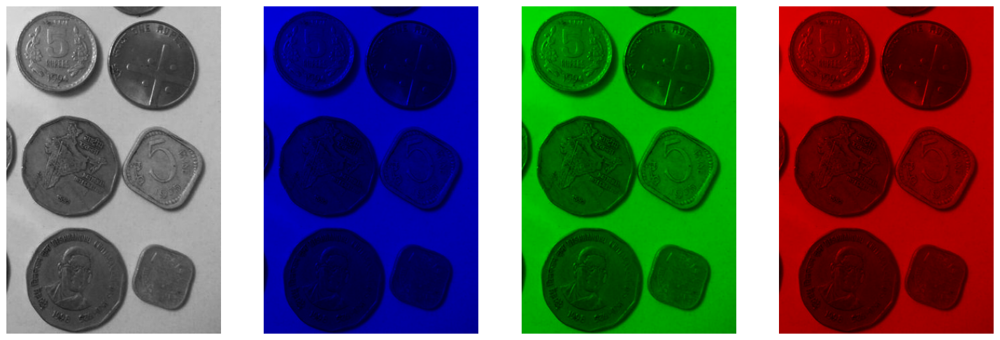

In [4]:
# Utwórz obrazy składowych
blue_channel = np.zeros_like(monety_szare)
blue_channel[:, :, 2] = monety_szare[:, :, 2]  # Składowa niebieska

green_channel = np.zeros_like(monety_szare)
green_channel[:, :, 1] = monety_szare[:, :, 1]  # Składowa zielona

red_channel = np.zeros_like(monety_szare)
red_channel[:, :, 0] = monety_szare[:, :, 0]  # Składowa czerwona

display_images([monety_szare, blue_channel, green_channel, red_channel])


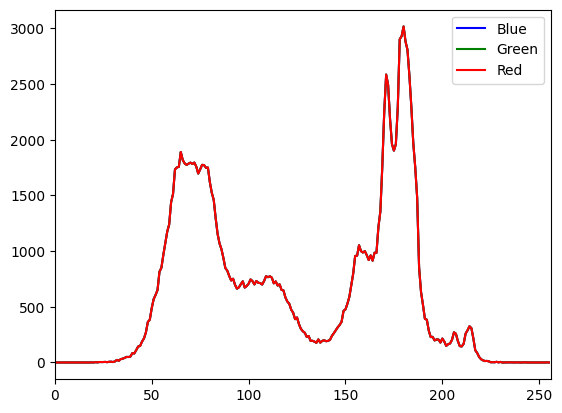

In [5]:
for i, col in enumerate(['b', 'g', 'r']):
    hist = cv2.calcHist([monety_szare], [i], None, [256], [0, 256])
    plt.plot(hist, color=col)
    plt.xlim([0, 256])
    plt.legend(['Blue', 'Green', 'Red'])
plt.show()

In [6]:
print_info(monety_szare)

class:  ndarray
shape:  (490, 321, 3)
strides:  (963, 3, 1)
itemsize:  1
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x1080f0000
byteorder:  little
byteswap:  False
type: uint8
None
CHANNEL1 min/max 19 254
CHANNEL2 min/max 19 254
CHANNEL3 min/max 19 254


## HSV

In [7]:
print_info(monety_hsv)

class:  ndarray
shape:  (490, 321, 3)
strides:  (963, 3, 1)
itemsize:  1
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x108168000
byteorder:  little
byteswap:  False
type: uint8
None
CHANNEL1 min/max 0 0
CHANNEL2 min/max 0 0
CHANNEL3 min/max 19 254


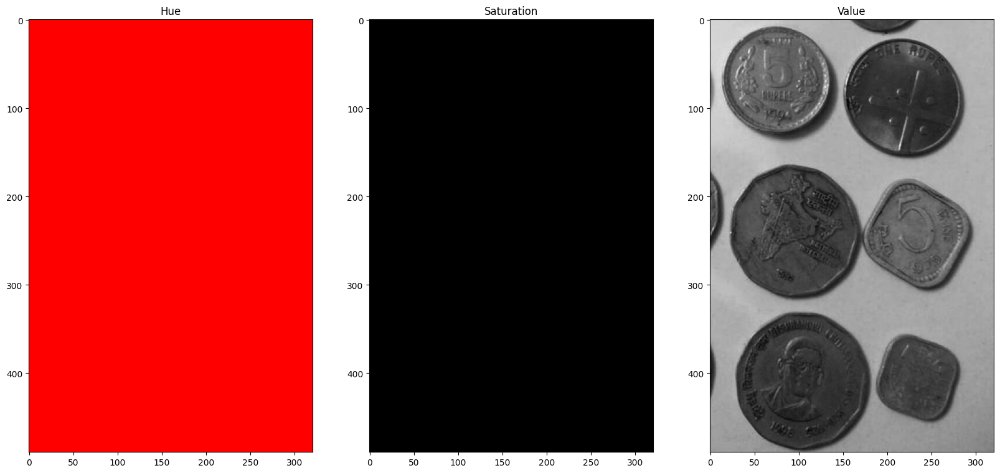

In [8]:
show_hsv(monety_hsv)

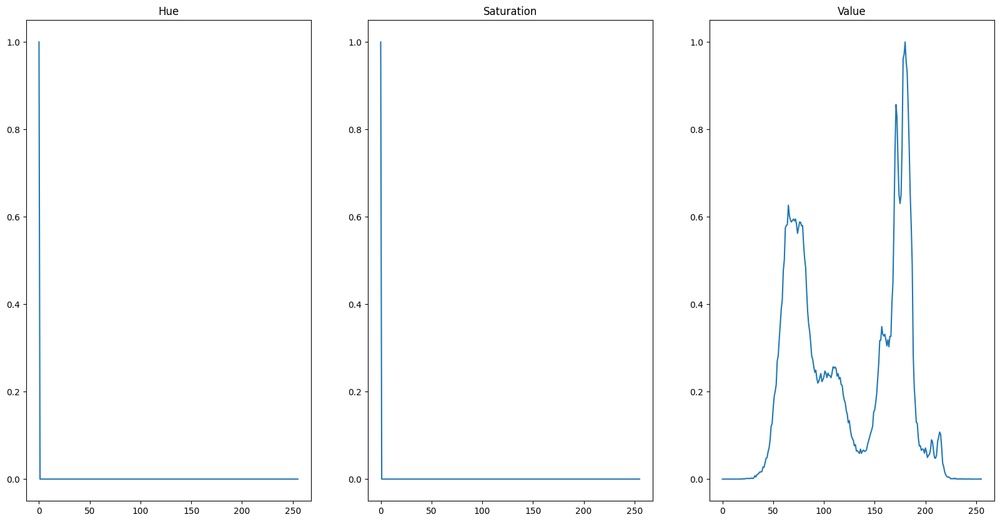

In [9]:
hist_hsv_normalized(monety_hsv)

## GLOBAL Thresholding

In [10]:
thresh = 135
ret, thresh1 = cv2.threshold(monety_szare, thresh, 255, cv2.THRESH_BINARY) # img, threshold, maxval, type
ret, thresh2 = cv2.threshold(monety_szare, thresh, 255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(monety_szare, thresh, 255, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(monety_szare, thresh, 255, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(monety_szare, thresh, 255, cv2.THRESH_TOZERO_INV)

print('thresh1 info: ', np.info(thresh1))

class:  ndarray
shape:  (490, 321, 3)
strides:  (963, 3, 1)
itemsize:  1
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x148d20000
byteorder:  little
byteswap:  False
type: uint8
thresh1 info:  None


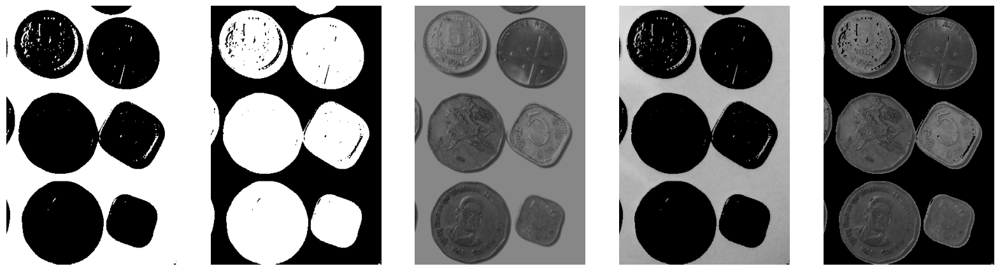

In [11]:
display_images([thresh1, thresh2, thresh3, thresh4, thresh5])

## BGR 2 GRAY

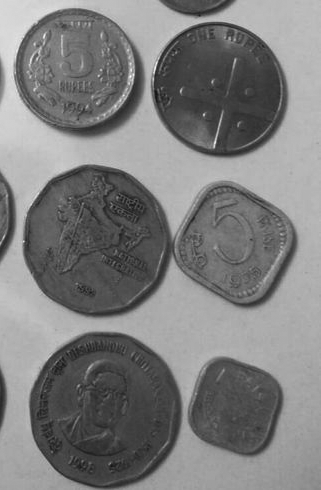

In [12]:
monety_szare_gray  = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2GRAY)
Image.fromarray(monety_szare_gray)

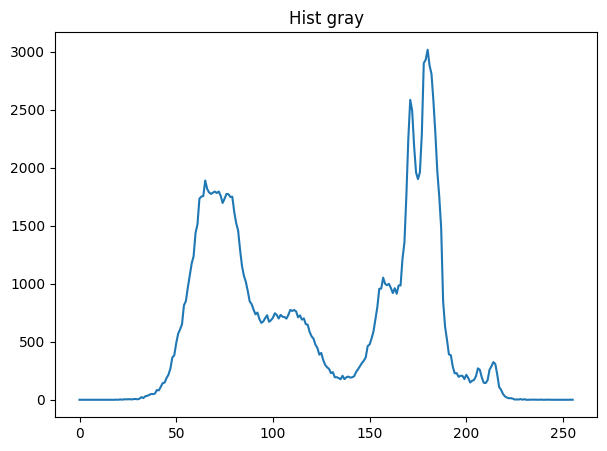

In [13]:
hist_gray_plot(monety_szare_gray)

In [14]:
print_info(monety_szare_gray)

class:  ndarray
shape:  (490, 321)
strides:  (321, 1)
itemsize:  1
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x138e20000
byteorder:  little
byteswap:  False
type: uint8
None
min/max 19 254


## ADAPTIVE Thresholding

OTSU threshold:  127.0


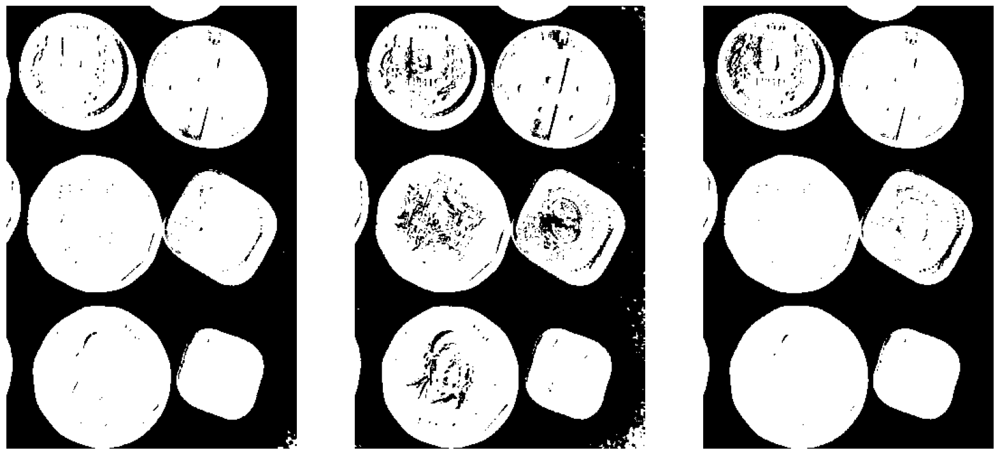

In [15]:
# ADAPTIVE Thresholding
thresh2 = cv2.adaptiveThreshold(monety_szare_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 181, 0)
# img, maxval, adaptiveMethod, thresholdType, blockSize, C
thresh3 = cv2.adaptiveThreshold(monety_szare_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 181, 0)

# OTSU Thresholding
ret, thresh4 = cv2.threshold(monety_szare_gray, 145, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) # img, threshold, maxval, type

print("OTSU threshold: ", ret)
display_images([thresh2, thresh3, thresh4], gray=True)

# Rozwiązanie części 1B:


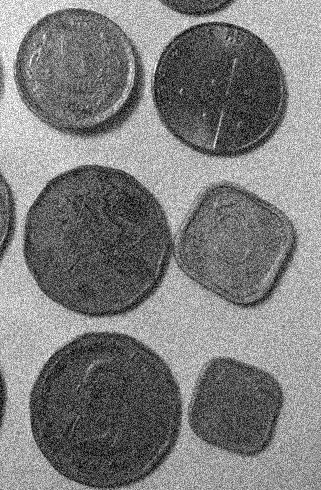

In [16]:
# 1B
monety_szare_szum = cv2.imread('dane/Monety_szare_szum.bmp')
monety_szare_szum_gray = cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2GRAY)
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

In [17]:
print_info(monety_szare_szum)

class:  ndarray
shape:  (490, 321, 3)
strides:  (963, 3, 1)
itemsize:  1
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x148368000
byteorder:  little
byteswap:  False
type: uint8
None
CHANNEL1 min/max 0 255
CHANNEL2 min/max 0 255
CHANNEL3 min/max 0 255


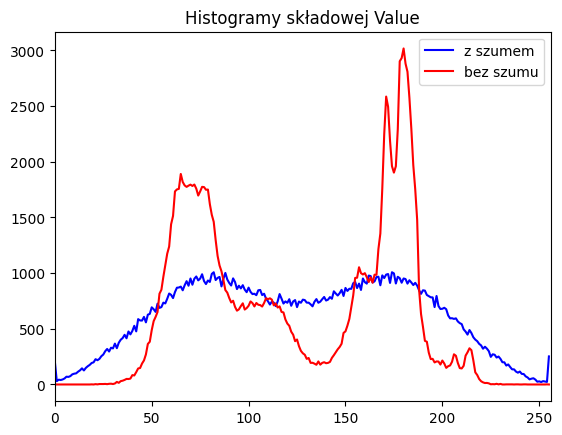

In [18]:
monety_szum_hsv = cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2HSV) # HSV - Hue, Saturation, Value
monety_hsv = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2HSV) # HSV - Hue, Saturation, Value

hist = cv2.calcHist([monety_szum_hsv], [2], None, [256], [0, 256]) # img, channels, mask, histSize, ranges
hist2 = cv2.calcHist([monety_hsv], [2], None, [256], [0, 256]) # img, channels, mask, histSize, ranges

plt.plot(hist, label = 'z szumem', color='b')
plt.plot(hist2, label = 'bez szumu',color='r')
plt.xlim([0, 256])
plt.legend()
plt.title("Histogramy składowej Value")
plt.show()

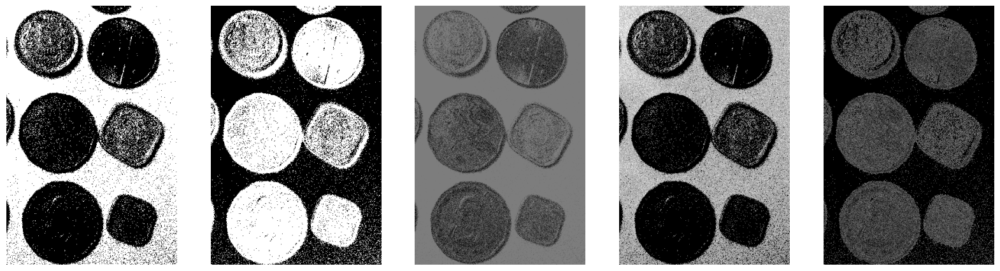

In [19]:
# GLOBAL Thresholding
thresh = 125
ret, thresh1 = cv2.threshold(monety_szare_szum, thresh, 255, cv2.THRESH_BINARY) # img, threshold, maxval, type
ret, thresh2 = cv2.threshold(monety_szare_szum, thresh, 255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(monety_szare_szum, thresh, 255, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(monety_szare_szum, thresh, 255, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(monety_szare_szum, thresh, 255, cv2.THRESH_TOZERO_INV)

display_images([thresh1, thresh2, thresh3, thresh4, thresh5])

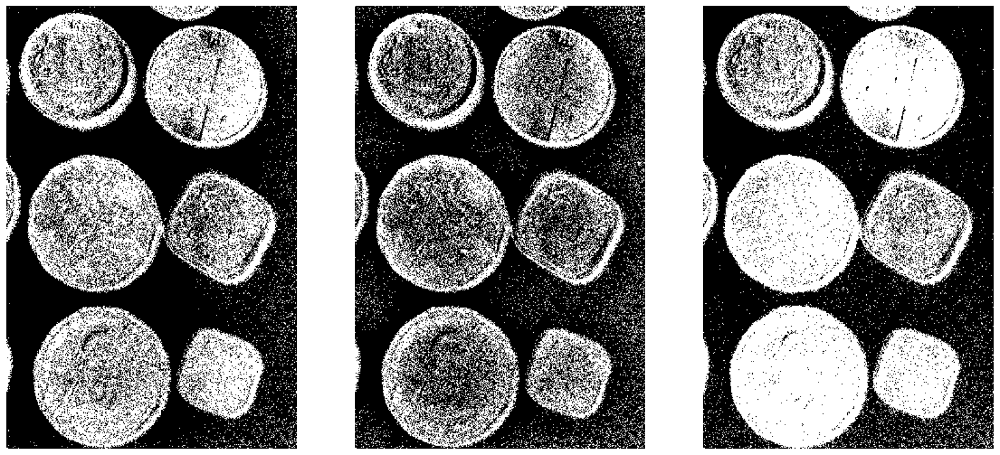

In [20]:
c= 21
# ADAPTIVE Thresholding
thresh2 = cv2.adaptiveThreshold(monety_szare_szum_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 151, c)
# img, maxval, adaptiveMethod, thresholdType, blockSize, C
thresh3 = cv2.adaptiveThreshold(monety_szare_szum_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 171, c)

# OTSU Thresholding
ret, thresh4 = cv2.threshold(monety_szare_szum_gray, 145, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) # img, threshold, maxval, type

display_images([thresh2, thresh3, thresh4], gray=True)

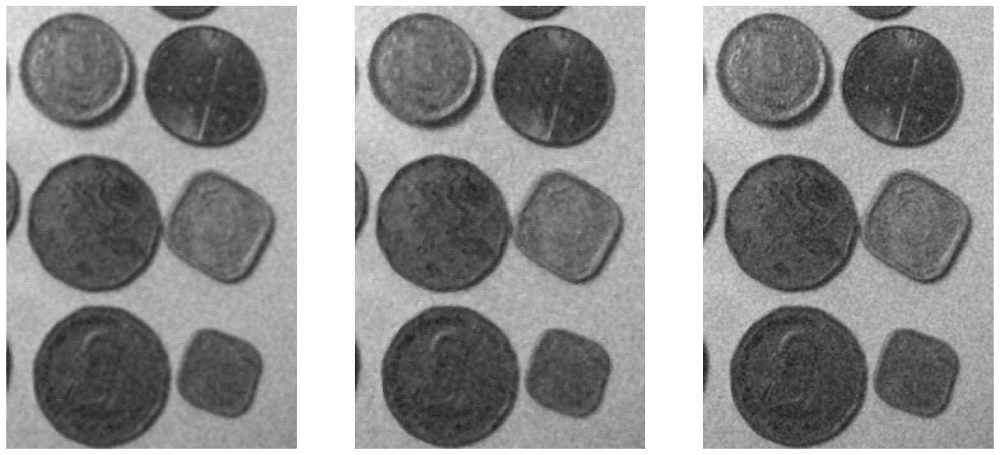

In [21]:
# cv blur
blur = cv2.blur(monety_szare_szum,(5,5)) # img, kernelSize
median_blur = cv2.medianBlur(monety_szare_szum, 5) # img, kernelSize
lowpass_blur = cv2.GaussianBlur(monety_szare_szum, (5,5), 0) # img, kernelSize, sigmaX
display_images([blur, median_blur, lowpass_blur])

#### funkcja bulr (filtr uśredniający) działa najlepiej - tło za monetami jest najbardziej jednolite
#### funkcja medianBlur (filtr medianowy) - tło jest bardziej szorstkie, ale monety są lepiej widoczne
#### funkcja GaussianBlur (filtr Gaussa) - cały obraz z monetami jest bardziej szczegółowy, ale tło jest mniej jednolite

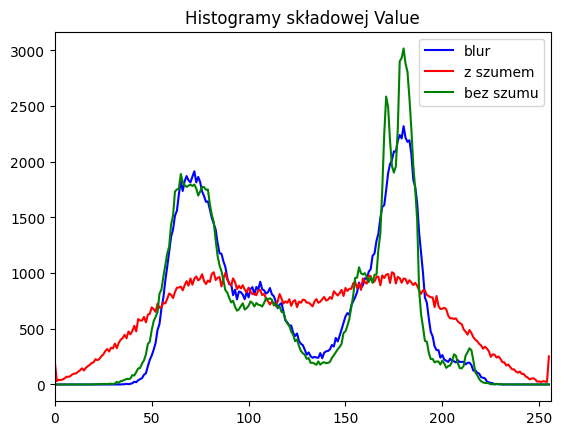

In [22]:
hist_blur = cv2.calcHist([blur], [2], None, [256], [0, 256]) # img, channels, mask, histSize, ranges
hist = cv2.calcHist([monety_szare_szum], [2], None, [256], [0, 256]) # img, channels, mask, histSize, ranges
hist2 = cv2.calcHist([monety_hsv], [2], None, [256], [0, 256]) # img, channels, mask, histSize, ranges

plt.plot(hist_blur, color='b')
plt.plot(hist, color='r')
plt.plot(hist2, color='g')
plt.xlim([0, 256])
plt.legend(['blur', 'z szumem', 'bez szumu'])
plt.title("Histogramy składowej Value")
plt.show()

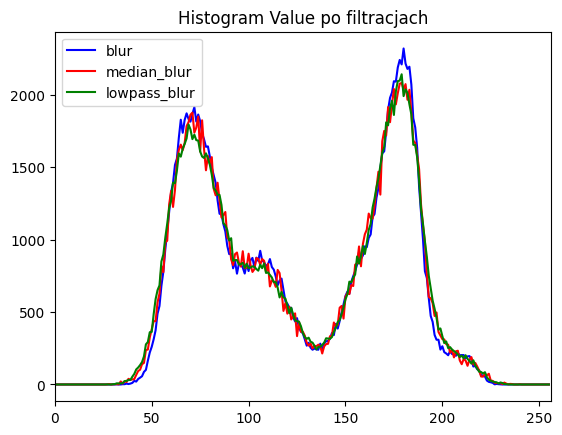

In [23]:
hist_blur = cv2.calcHist([blur], [2], None, [256], [0, 256]) # img, channels, mask, histSize, ranges
hist_median_blur = cv2.calcHist([median_blur], [2], None, [256], [0, 256]) # img, channels, mask, histSize, ranges
hist_lowpass_blur = cv2.calcHist([lowpass_blur], [2], None, [256], [0, 256]) # img, channels, mask, histSize, ranges

plt.plot(hist_blur, color='b')
plt.plot(hist_median_blur, color='r')
plt.plot(hist_lowpass_blur, color='g')
plt.xlim([0, 256])
plt.legend(['blur', 'median_blur', 'lowpass_blur'])
plt.title("Histogram Value po filtracjach")
plt.show()

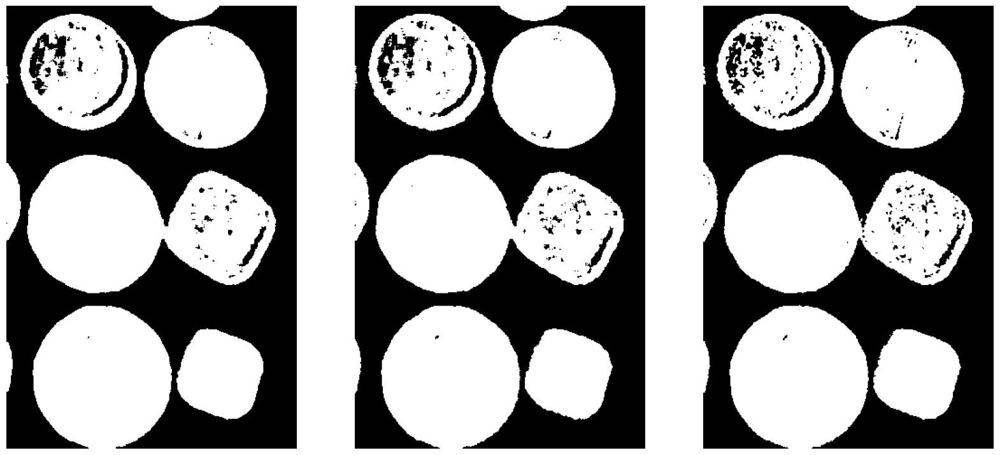

In [24]:
# GLOBAL Thresholding
thresh = 125
ret, thresh1blur= cv2.threshold(blur, thresh, 255, cv2.THRESH_BINARY_INV) # img, threshold, maxval, type
ret, thresh1median_blur = cv2.threshold(median_blur, thresh, 255, cv2.THRESH_BINARY_INV)
ret, thresh1lowpass_blur = cv2.threshold(lowpass_blur, thresh, 255, cv2.THRESH_BINARY_INV)

display_images([thresh1blur, thresh1median_blur, thresh1lowpass_blur])

In [25]:
blur_gray = cv2.cvtColor(blur, cv2.COLOR_BGR2GRAY)

## Adaptive Thresholding

### blur

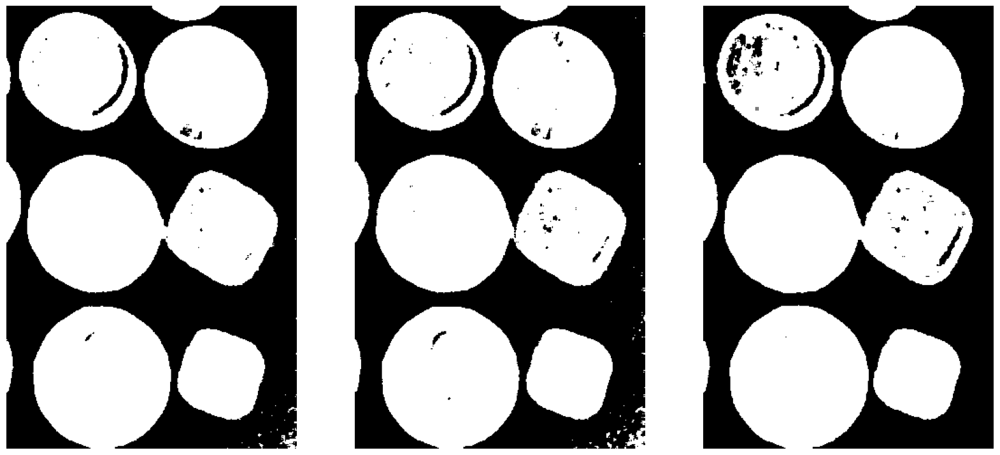

In [26]:
c=0
# ADAPTIVE Thresholding
thresh2 = cv2.adaptiveThreshold(blur_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 191, c)
# img, maxval, adaptiveMethod, thresholdType, blockSize, C
thresh3 = cv2.adaptiveThreshold(blur_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 313, c)

# OTSU Thresholding
ret, thresh4 = cv2.threshold(blur_gray, 145, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) # img, threshold, maxval, type

display_images([thresh2, thresh3, thresh4], gray=True)


### median blur

In [27]:
median_blur = cv2.cvtColor(median_blur, cv2.COLOR_BGR2GRAY)

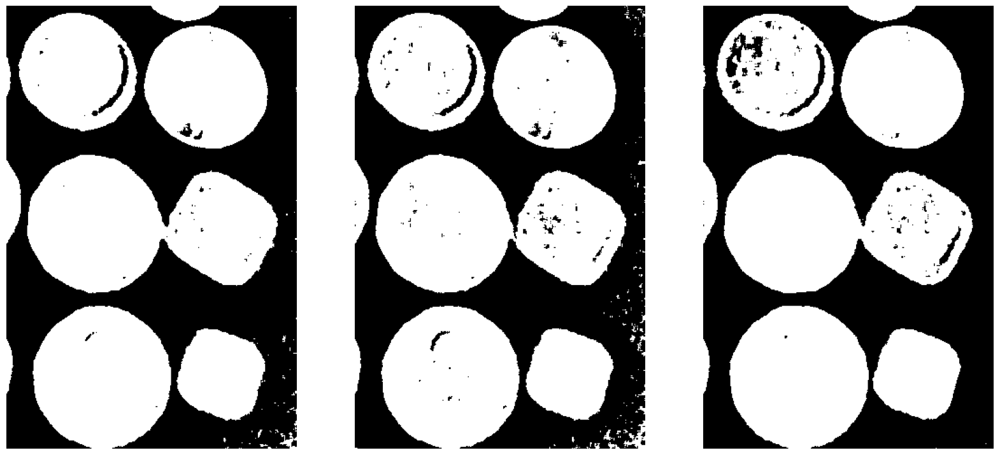

In [28]:
c = 0
# ADAPTIVE Thresholding
thresh2 = cv2.adaptiveThreshold(median_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 191, c)
# img, maxval, adaptiveMethod, thresholdType, blockSize, C
thresh3 = cv2.adaptiveThreshold(median_blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 291, c)

# OTSU Thresholding
ret, thresh4 = cv2.threshold(median_blur, 145, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) # img, threshold, maxval, type

display_images([thresh2, thresh3, thresh4], gray=True)

### lowpass blur

In [29]:
lowpass_blur = cv2.cvtColor(lowpass_blur, cv2.COLOR_BGR2GRAY)

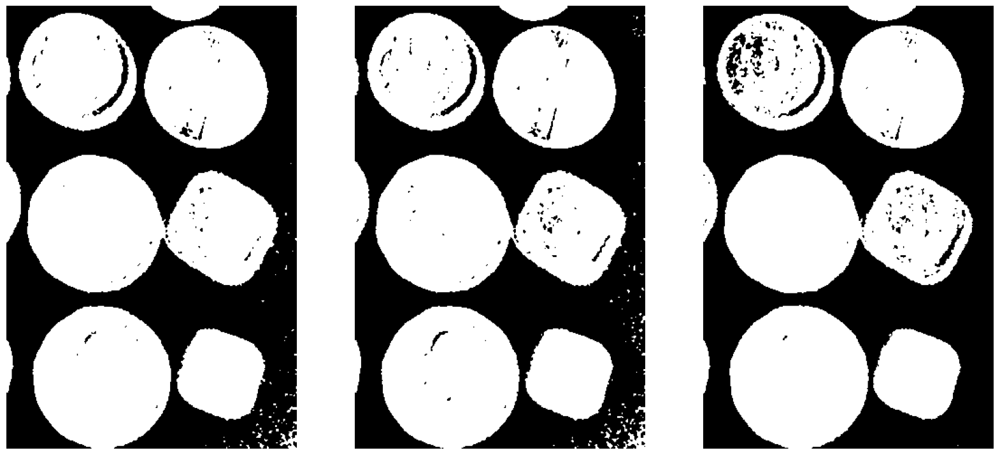

In [30]:
c = 0
# ADAPTIVE Thresholding
thresh2 = cv2.adaptiveThreshold(lowpass_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 191, c)
# img, maxval, adaptiveMethod, thresholdType, blockSize, C
thresh3 = cv2.adaptiveThreshold(lowpass_blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 331, c)

# OTSU Thresholding
ret, thresh4 = cv2.threshold(lowpass_blur, 145, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) # img, threshold, maxval, type

display_images([thresh2, thresh3, thresh4], gray=True)


# Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Posłuż się kształtem histogramu dla wybranej składowej.

# Rozwiązanie części 2A:

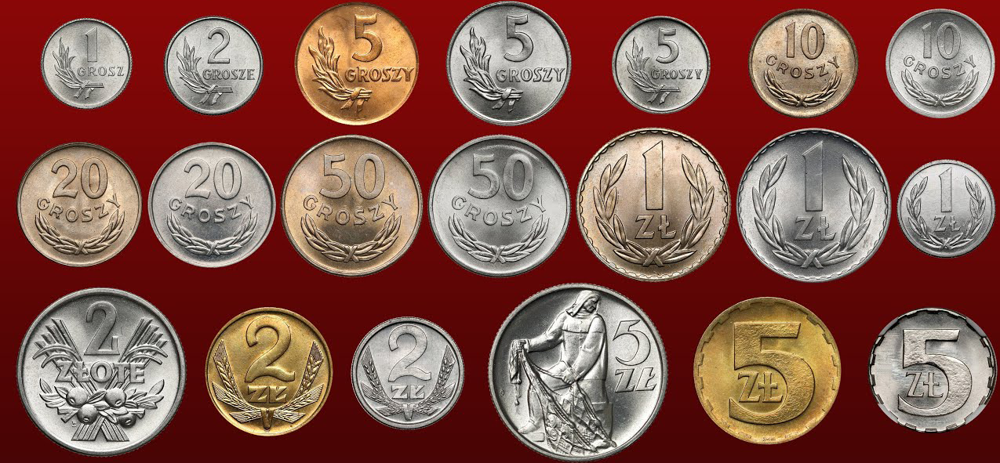

In [31]:
monety_kolor = cv2.imread('dane/Monety_kolor.bmp')
monety_kolor_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV) # HSV - Hue, Saturation, Value
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

## Podgląd BGR

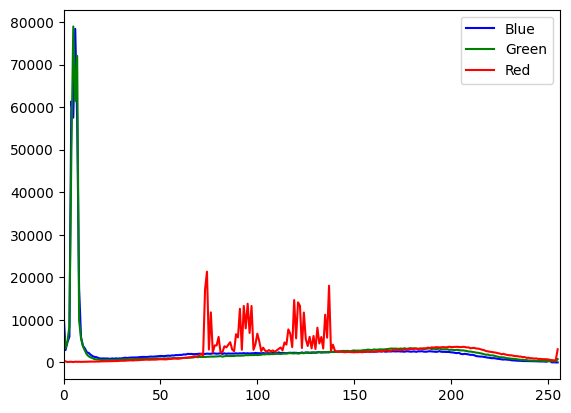

In [32]:
for i, col in enumerate(['b', 'g', 'r']):
    hist = cv2.calcHist([monety_kolor], [i], None, [256], [0, 256])
    plt.plot(hist, color=col)
    plt.xlim([0, 256])
    plt.legend(['Blue', 'Green', 'Red'])

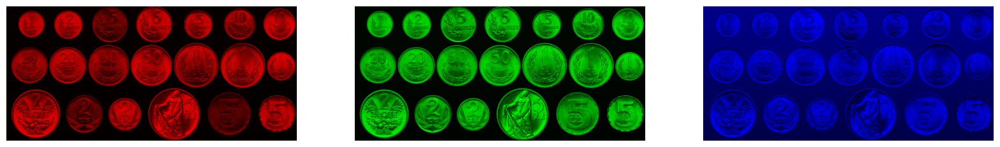

In [33]:
# Utwórz obrazy składowych
blue_channel = np.zeros_like(monety_kolor)
blue_channel[:, :, 0] = monety_kolor[:, :, 0]  # Składowa niebieska

green_channel = np.zeros_like(monety_kolor)
green_channel[:, :, 1] = monety_kolor[:, :, 1]  # Składowa zielona

red_channel = np.zeros_like(monety_kolor)
red_channel[:, :, 2] = monety_kolor[:, :, 2]  # Składowa czerwona

display_images([blue_channel, green_channel, red_channel])

In [34]:
# info
print("monety_kolor_hsv info: ")
print(np.info(monety_kolor_hsv))
print('min, max HUE:', monety_kolor_hsv[:,:,0].min(), monety_kolor_hsv[:,:,0].max())
print('min, max SAT:', monety_kolor_hsv[:,:,1].min(), monety_kolor_hsv[:,:,1].max())
print('min, max VAL:', monety_kolor_hsv[:,:,2].min(), monety_kolor_hsv[:,:,2].max())

monety_kolor_hsv info: 
class:  ndarray
shape:  (591, 1275, 3)
strides:  (3825, 3, 1)
itemsize:  1
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x1086b0000
byteorder:  little
byteswap:  False
type: uint8
None
min, max HUE: 0 179
min, max SAT: 0 255
min, max VAL: 0 255


## Podgląd HSV

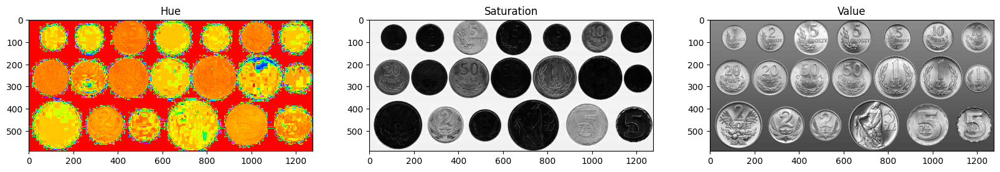

In [35]:
show_hsv(monety_kolor_hsv)

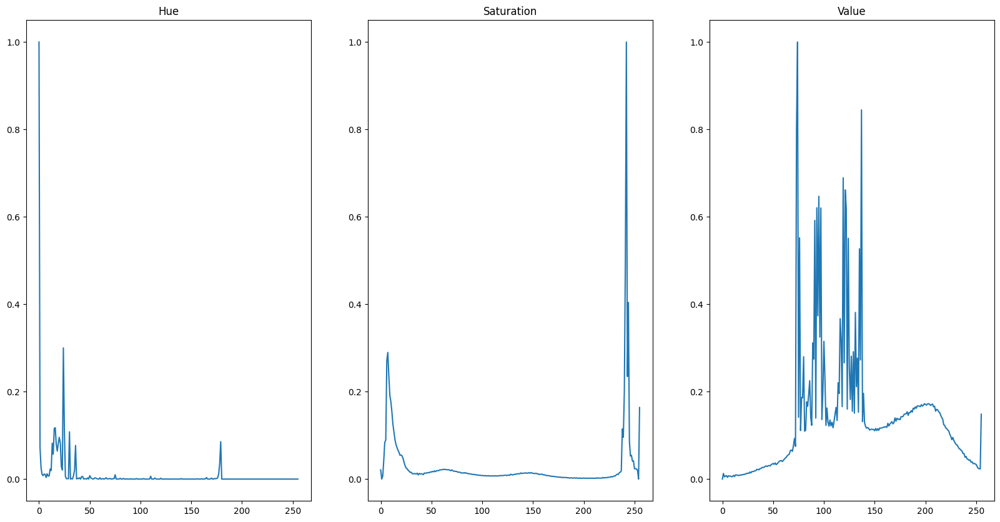

In [36]:
hist_hsv_normalized(monety_kolor_hsv)

### TO GRAY

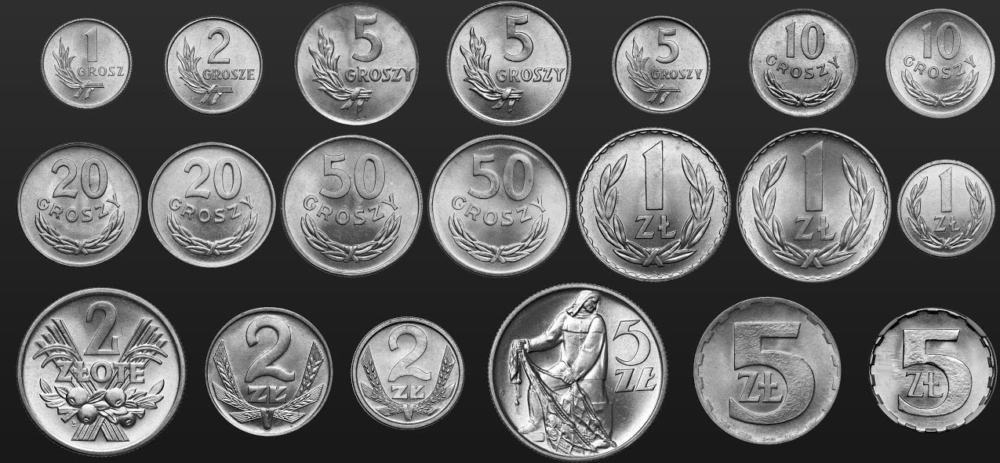

In [37]:
m2_gray = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2GRAY)
Image.fromarray(m2_gray)

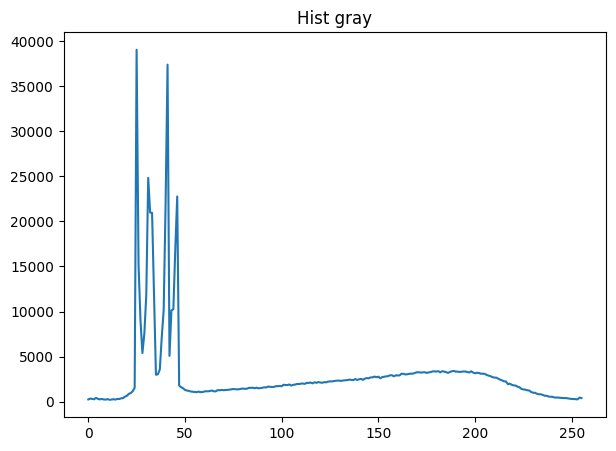

In [38]:
hist_gray_plot(m2_gray)

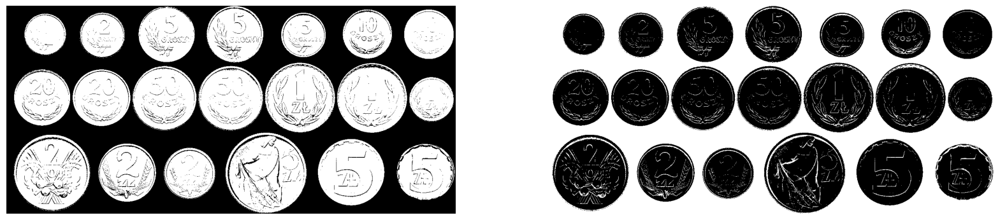

In [39]:
# GLOBAL Thresholding
thresh = 60
ret, thresh1 = cv2.threshold(m2_gray, thresh, 255, cv2.THRESH_BINARY) # img, threshold, maxval, type
ret, thresh2 = cv2.threshold(m2_gray, thresh, 255, cv2.THRESH_BINARY_INV)

display_images([thresh1, thresh2], gray=True)

OTSU threshold:  108.0


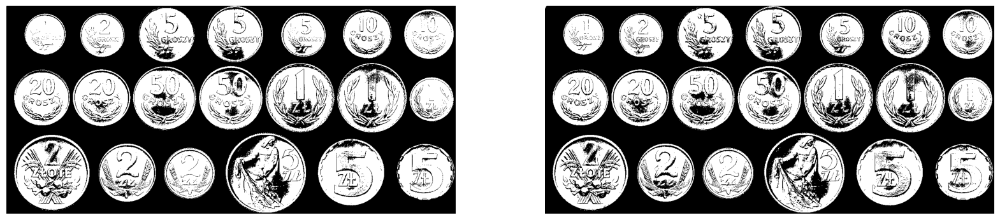

In [40]:
# adaptive
c= 6
size = 171
# ADAPTIVE Thresholding
thresh2 = cv2.adaptiveThreshold(m2_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, size, c)
# img, maxval, adaptiveMethod, thresholdType, blockSize, C
thresh3 = cv2.adaptiveThreshold(m2_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 291, 3)

# OTSU Thresholding
ret, thresh4 = cv2.threshold(m2_gray, 145, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) # img, threshold, maxval, type

print("OTSU threshold: ", ret)
display_images([thresh2, thresh3], gray=True)

#### metoda gausowska zwykle wymaga wiekszej wielkosci okna

# Rozwiązanie części 2B:

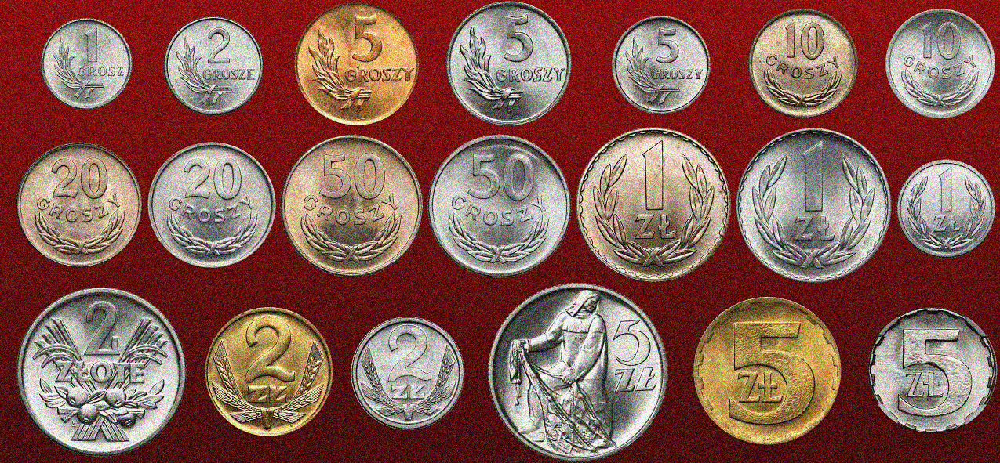

In [41]:
monety_kolor_szum = cv2.imread('dane/Monety_kolor_szum.bmp')
kolor_szum_hsv = cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2HSV) # HSV - Hue, Saturation, Value
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

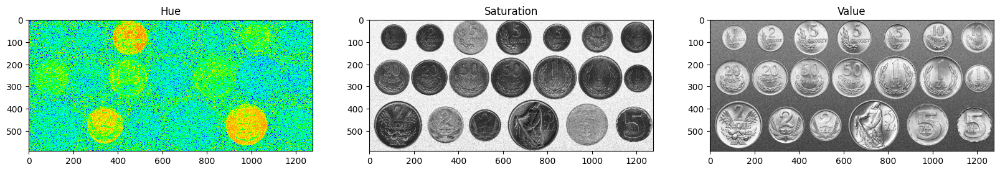

In [42]:
show_hsv(kolor_szum_hsv)

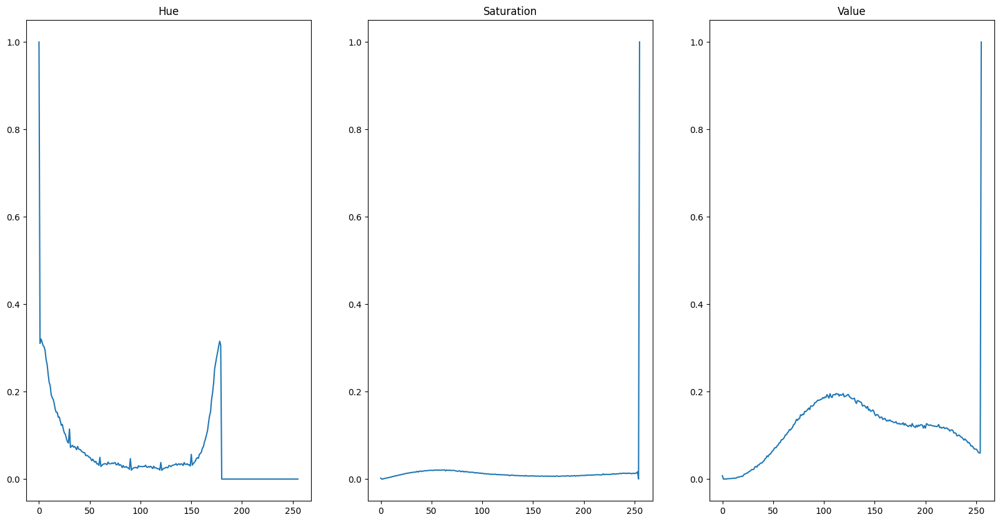

In [43]:
hist_hsv_normalized(kolor_szum_hsv)

In [44]:
monety_kolor_blur = cv2.blur(monety_kolor_szum,(5,5)) # img, kernelSize
monety_kolor_median_blur = cv2.medianBlur(monety_kolor_szum, 5) # img, kernelSize
monety_kolor_lowpass_blur = cv2.GaussianBlur(monety_kolor_szum, (5,5), 0) # img, kernelSize, sigmaX

# convert to rgb
monety_kolor_blur = cv2.cvtColor(monety_kolor_blur, cv2.COLOR_BGR2RGB)
monety_kolor_median_blur = cv2.cvtColor(monety_kolor_median_blur, cv2.COLOR_BGR2RGB)
monety_kolor_lowpass_blur = cv2.cvtColor(monety_kolor_lowpass_blur, cv2.COLOR_BGR2RGB)

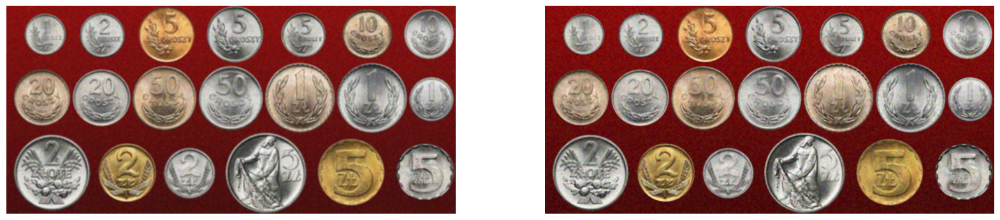

In [45]:
display_images([monety_kolor_blur, monety_kolor_median_blur])

In [46]:
# conert to hsv 
monety_kolor_blur_hsv = cv2.cvtColor(monety_kolor_blur, cv2.COLOR_BGR2HSV) # HSV - Hue, Saturation, Value
monety_kolor_median_blur_hsv = cv2.cvtColor(monety_kolor_median_blur, cv2.COLOR_BGR2HSV) # HSV - Hue, Saturation, Value
monety_kolor_lowpass_blur_hsv = cv2.cvtColor(monety_kolor_lowpass_blur, cv2.COLOR_BGR2HSV) # HSV - Hue, Saturation, Value

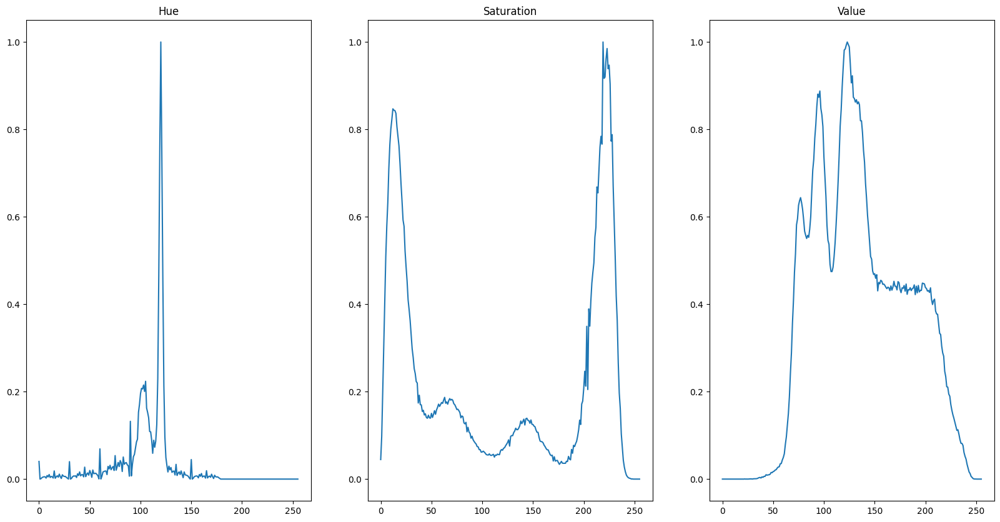

In [47]:
hist_hsv_normalized(monety_kolor_blur_hsv)

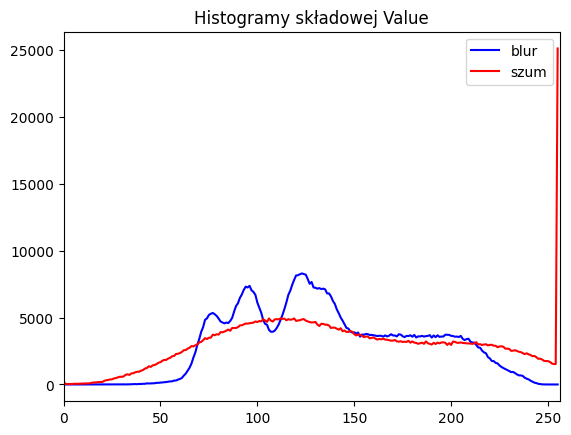

In [48]:
# value comparison 
hist1 = cv2.calcHist([monety_kolor_blur_hsv], [2], None, [256], [0, 256]) # img, channels, mask, histSize, ranges
hist2 = cv2.calcHist([kolor_szum_hsv], [2], None, [256], [0, 256]) # img, channels, mask, histSize, ranges

plt.plot(hist1, color='b')
plt.plot(hist2, color='r')
plt.xlim([0, 256])
plt.legend(['blur', 'szum'])
plt.title("Histogramy składowej Value")
plt.show()

# GRAY

In [49]:
monety_blur_gray = cv2.cvtColor(monety_kolor_blur, cv2.COLOR_BGR2GRAY)
monety_median_blur_gray = cv2.cvtColor(monety_kolor_median_blur, cv2.COLOR_BGR2GRAY)
monety_lowpass_blur_gray = cv2.cvtColor(monety_kolor_lowpass_blur, cv2.COLOR_BGR2GRAY)

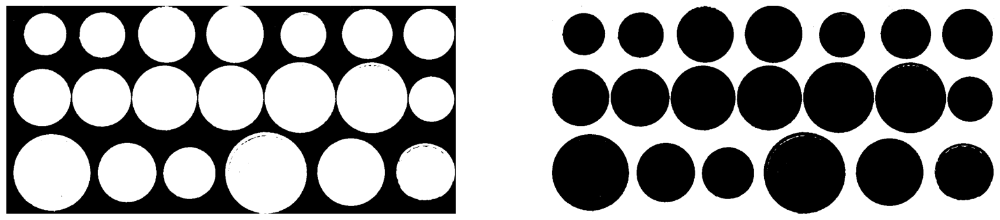

In [50]:
# GLOBAL Thresholding

thresh = 39
ret, thresh1 = cv2.threshold(monety_blur_gray, thresh, 255, cv2.THRESH_BINARY) # img, threshold, maxval, type
ret, thresh2 = cv2.threshold(monety_blur_gray, thresh, 255, cv2.THRESH_BINARY_INV)

display_images([thresh1, thresh2], gray=True)

OTSU threshold:  94.0


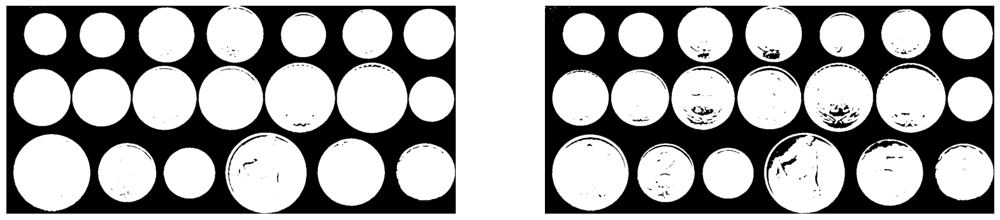

In [51]:
# adaptive
c= 10
size = 341
# ADAPTIVE Thresholding
thresh2 = cv2.adaptiveThreshold(monety_blur_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 991, c)
# img, maxval, adaptiveMethod, thresholdType, blockSize, C
thresh3 = cv2.adaptiveThreshold(monety_blur_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 1001, 11)

# OTSU Thresholding
ret, thresh4 = cv2.threshold(monety_blur_gray, 145, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) # img, threshold, maxval, type

print("OTSU threshold: ", ret)
display_images([thresh2, thresh3], gray=True)

# Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

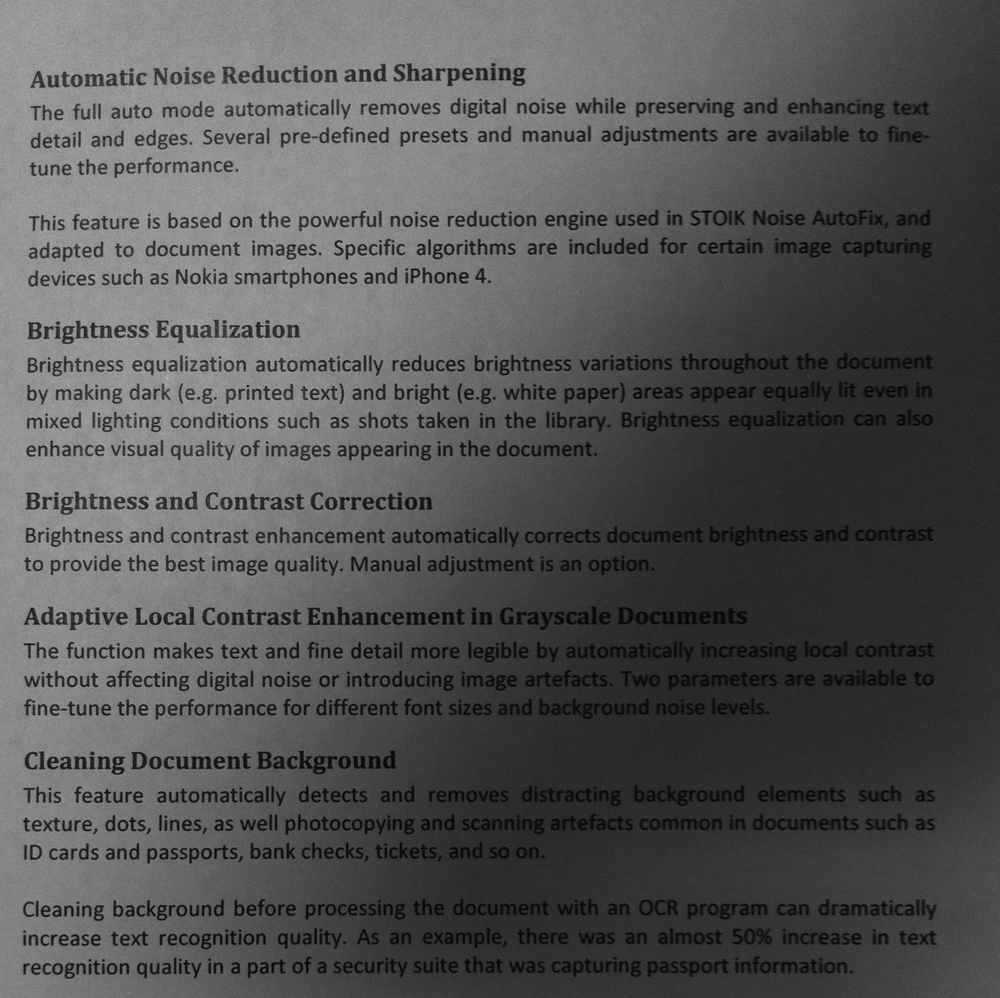

In [53]:
text = cv2.imread('dane/Tekst1.bmp')
Image.fromarray(cv2.cvtColor(text, cv2.COLOR_BGR2GRAY))

# Rozwiązanie:

In [54]:
text_hsv = cv2.cvtColor(text, cv2.COLOR_BGR2HSV) # HSV - Hue, Saturation, Value

In [55]:
text_gray = cv2.cvtColor(text, cv2.COLOR_BGR2GRAY)

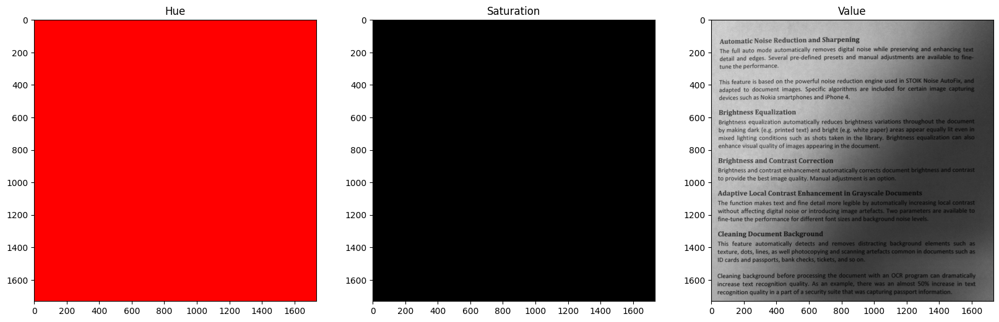

In [56]:
show_hsv(text_hsv)

In [57]:
text_bin = np.zeros_like(text_gray)
text_bin.shape

(1731, 1734)

In [58]:
window_size = 250
step = 250
text_gray = cv2.cvtColor(text, cv2.COLOR_BGR2GRAY)

In [59]:
# example = text_gray[60:60+window_size, 1400:1400+window_size]
# _, bin_example = cv2.threshold(example, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
# display_images([example, bin_example], gray=True)

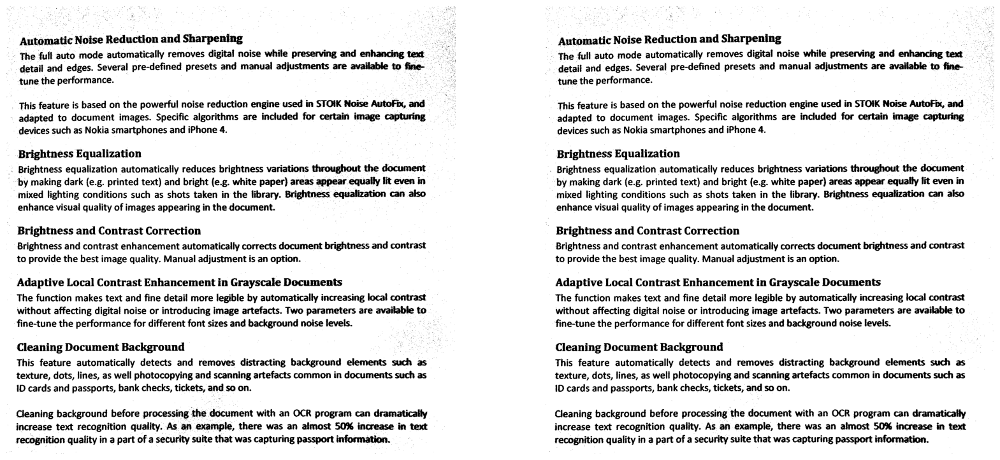

In [60]:
text_gray = cv2.cvtColor(text, cv2.COLOR_BGR2GRAY)

c= 10
size = 341
# ADAPTIVE Thresholding
thresh2 = cv2.adaptiveThreshold(text_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 501, c)
# img, maxval, adaptiveMethod, thresholdType, blockSize, C
thresh3 = cv2.adaptiveThreshold(text_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 1001, 11)

display_images([thresh2, thresh3], gray=True)

In [61]:
def moving_otsu(image, window_size):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    step = window_size // 2
    height, width = gray_image.shape
    binary_image = np.zeros((height, width), dtype=np.uint8)
    
    for x in range(0, width, step):
        for y in range(0, height, step):
            _, window_binary = cv2.threshold(gray_image[y:y + window_size, x: x+ window_size], 0, 255, cv2.THRESH_OTSU)
            binary_image[y: y + window_size, x: x + window_size] = np.maximum(binary_image[y: y + window_size, x: x + window_size], window_binary)
    return binary_image


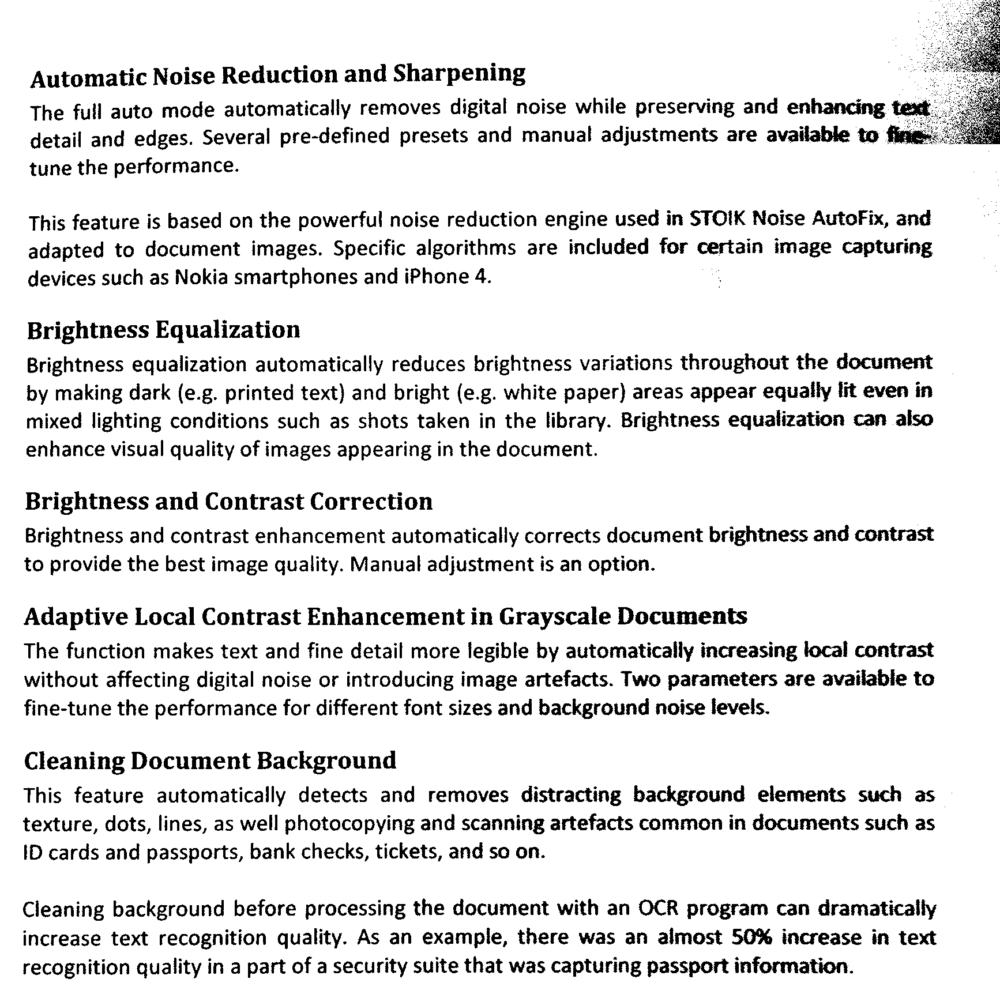

In [62]:
bin_otsu = moving_otsu(text, 250)
Image.fromarray(bin_otsu)